In [1]:
import os
import numpy as np
from copy import deepcopy

import mne

import matplotlib
%matplotlib qt
%gui qt
import matplotlib.pyplot as plt

from utils.transform_to_standard import transform_to_standard

In [9]:
edf_dir = './data/edf'
file_name = 'S001R04.edf'
edf_file = os.path.join(edf_dir, file_name)
raw = mne.io.read_raw_edf(edf_file, preload=True)
original_bad_channels = deepcopy(raw.info['bads'])

Extracting EDF parameters from D:\My Files Onedrive\OneDrive - buaa.edu.cn\various events\大三下作业\模式识别与机器学习\EEG_Classification\data\edf\S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


# Preprocess

About MNE:

EEG data can be considered in 3 different types: raw data, epoched data and evoked (averaged) data.

1. Raw Data: Continuous data is stored as a raw object in MNE. Data in a raw object are considered as a 2D array with dimensions of channels×time.

2. Epoched Data: This consists of time-locked trials. Data are a 3D array of events×channels×times.

3. Average Event Related Potentials: This is the result of averaging epoched data over trials. The output is time-locked to an external event, and it is stored as a 2D array of channels×times.

Reference:
[1] [Data Loading](https://neuro.inf.unibe.ch/AlgorithmsNeuroscience/Tutorial_files/DataLoading.html)

Store basic info of the data

In [10]:
sample_freq = raw.info.get('sfreq')
ch_names = raw.info.get('ch_names')

Inspection of the data

Opening raw-browser...


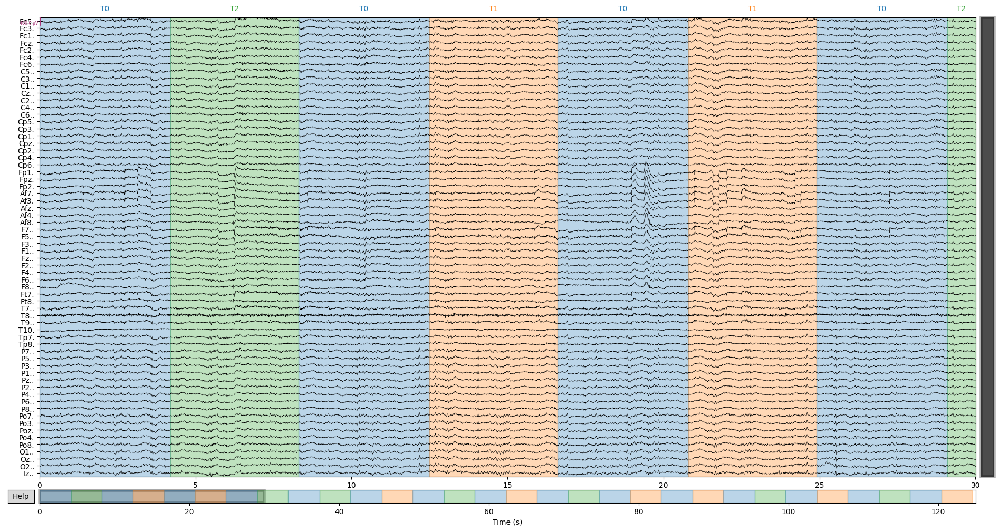

In [11]:
raw.plot(duration=30, n_channels=len(raw.ch_names), scalings={'eeg':200e-6}, remove_dc=False)

## Step 1: Add Locations Info


In [12]:
raw_ch_names = raw.info.get('ch_names')
montage=mne.channels.make_standard_montage('standard_1020')
mapping = transform_to_standard(raw_ch_names, montage.ch_names)
raw.rename_channels(mapping)
raw.set_montage(montage, on_missing = 'raise', verbose = None)

<RawEDF | S001R04.edf, 64 x 20000 (125.0 s), ~9.9 MB, data loaded>

In [14]:
fig = montage.plot(kind='3d', show_names=False)
fig.gca().view_init(azim=20, elev=15)  # set view angle
fig = montage.plot(kind='topomap', show_names=False)

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


## Step 2: Setting the EEG reference

Sometimes individual channels malfunction and provide data that is too noisy to be usable. Before setting reference, we should find the bad channels

Opening raw-browser...


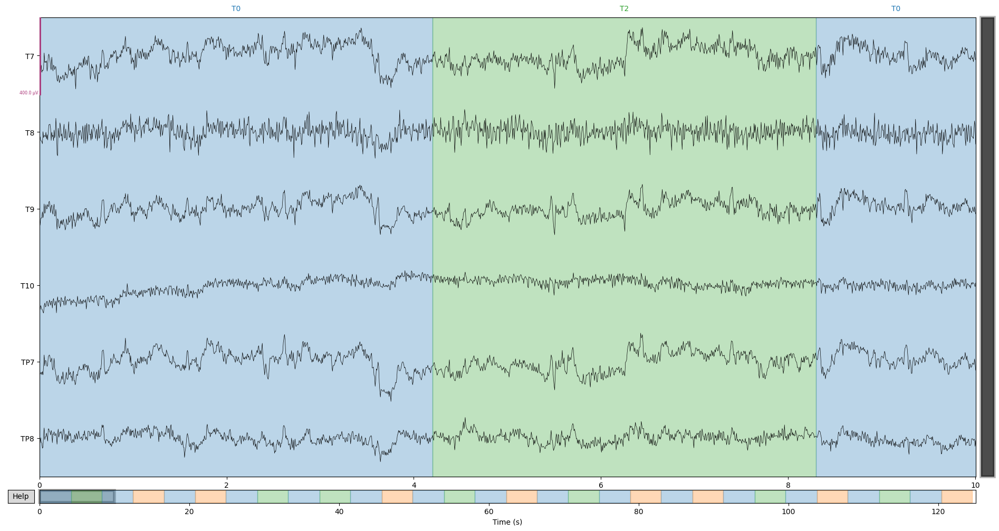

In [15]:
raw_rm_bad = raw.copy()
raw_rm_bad.info['bads'] = deepcopy(original_bad_channels)  # to avoid trouble caused by repeated operation
raw_rm_bad.info['bads'].extend([])   # pick bad channel from the interactive figure manually
show_bad_chan_picks = mne.pick_channels_regexp(raw_rm_bad.ch_names, regexp='T.')
raw_rm_bad.plot(duration=10,
                n_channels=len(show_bad_chan_picks),
                order=show_bad_chan_picks,
                scalings={'eeg':200e-6})

Referencing:
EEG recordings are collected by measuring the voltage differences between a part of the brain and the reference point. After collecting the data, the reference can be changed and this process is called re-referencing. If the reference changes, the amplitude of the signal at the channels will differ too. Therefore, referencing is very critical for EEG data. Re-referencing can be formulated as follows:

new electrical potential at channel 'x' = electrical potential at channel 'x' + electrical potential at the original reference - electrical potential at the new reference

(Note: 'x' corresponds to channel id)

Selecting the reference:
Athough there is no optimal strategy for selecting the reference, there are several commonly applied approaches. One way is to compute the average of potentials at all the channels and use this average potential as the reference. The new reference does not have to be an existing channel, it can be a virtual one as well. After subtracting the averaged potential from electrical potential at each channel, re-referencing would be completed. Another approach would be to select the channels where electrical activity is the lowest such as ears.

In [17]:
raw_avg_ref = raw_rm_bad.copy().set_eeg_reference(ref_channels='average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


## Step 3: Handling Bad Channels

In [53]:
# raw2 = raw.copy()
# raw2.info['bads'] = []
# epochs2 = mne.Epochs(raw2, events=events_from_annot)
# epochs2['1'].average().plot()

In [54]:
# raw.info['bads'] = deepcopy(original_bad_channels)  # to avoid trouble caused by repeated operation
# raw.info['bads'].extend(['T8','T10'])   # pick bad channel from the interactive figure mannually
# epochs = mne.Epochs(raw, events=events_from_annot)
# epochs['1'].average().plot()

### Interpolating bad channels

We should maintain the same data dimensionality for all subjects. Simply removing each channel that is bad can lead to a dramatic drop in data rank. In such cases it is desirable to reconstruct bad channels by interpolating its signal based on the signals of the good sensors around them.

Interpolation of EEG channels in MNE-Python is done using the spherical spline method, which projects the sensor locations onto a unit sphere and interpolates the signal at the bad sensor locations based on the signals at the good locations.

Interpolation of MEG channels uses the field mapping algorithms used in computing the forward solution. Interpolating bad channels in Raw objects is done with the `interpolate_bads()` method, which automatically applies the correct method (spherical splines or field interpolation) to EEG and MEG channels, respectively

By default, interpolate_bads() will clear out raw.info['bads'] after interpolation, so that the interpolated channels are no longer excluded from subsequent computations.

Ref:
[1] [How interpolation works](https://mne.tools/stable/auto_tutorials/preprocessing/15_handling_bad_channels.html#how-interpolation-works)
[2] [Spherical splines for scalp potential and current density mapping.](https://mne.tools/stable/auto_tutorials/preprocessing/15_handling_bad_channels.html#references)

Opening raw-browser...


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_37296\489097156.py:1: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  raw_avg_ref.interpolate_bads()


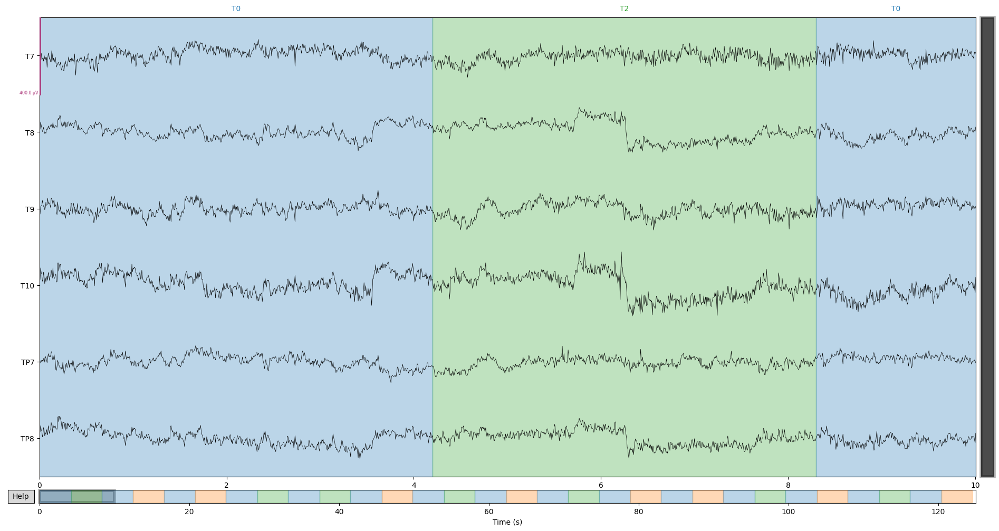

In [19]:
raw_avg_ref.interpolate_bads()
raw_avg_ref.plot(duration=10,
         n_channels=len(show_bad_chan_picks),
         order=show_bad_chan_picks,
         scalings={'eeg':200e-6})

## Step 4: Filter

### Power line noise

Power line noise is an environmental artifact that manifests as persistent oscillations centered around the AC power line frequency. Power line artifacts are easiest to see on plots of the spectrum, so we’ll use plot_psd() to illustrate. We’ll also write a little function that adds arrows to the spectrum plot to highlight the artifacts:

Effective window size : 12.800 (s)


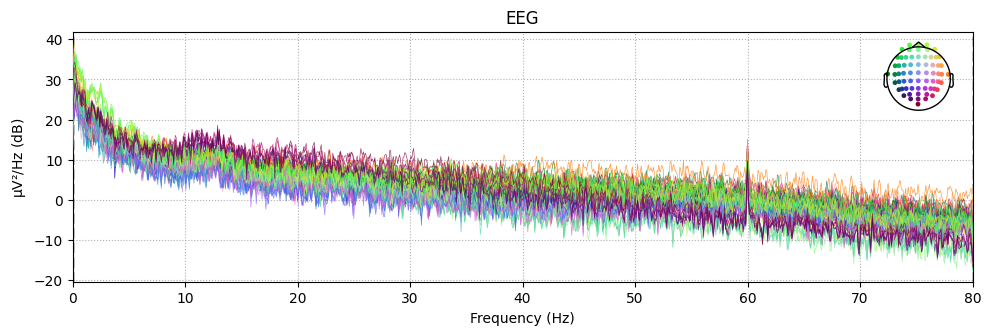

In [20]:
power_line_freq = 60
raw_avg_ref.plot_psd(tmax=np.inf, fmax=sample_freq/2)

In [21]:
fig = raw_avg_ref.plot_psd(tmax=np.inf, fmax=sample_freq/2, average=True)
# add some arrows at 60 Hz and its harmonics:
for ax in fig.axes[0:]:
    freqs = ax.lines[-1].get_xdata()
    psds = ax.lines[-1].get_ydata()
    for freq in (power_line_freq,):
        idx = np.searchsorted(freqs, freq)
        ax.arrow(x=freqs[idx], y=psds[idx] + 15, dx=0, dy=-12, color='red',
                 width=0.1, head_width=1, length_includes_head=True)

Effective window size : 12.800 (s)


Removing power-line noise can be done with a notch filter, applied directly to the Raw object, specifying an array of frequencies to be attenuated.

In [22]:
raw_notch = raw_avg_ref.copy().notch_filter(freqs=(power_line_freq,))
for title, data in zip(['Un', 'Notch '], [raw_rm_bad, raw_notch]):
    fig = data.plot_psd(fmax=sample_freq/2, average=True)
    fig.subplots_adjust(top=1)
    fig.suptitle('{}filtered'.format(title), size='xx-large', weight='bold')

Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 1057 samples (6.606 sec)

Effective window size : 12.800 (s)
Effective window size : 12.800 (s)


## Slow Drifts

Before we run the ICA, an important step is filtering the data to remove low-frequency drifts, which can negatively affect the quality of the ICA fit.

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 529 samples (3.306 sec)

Opening raw-browser...


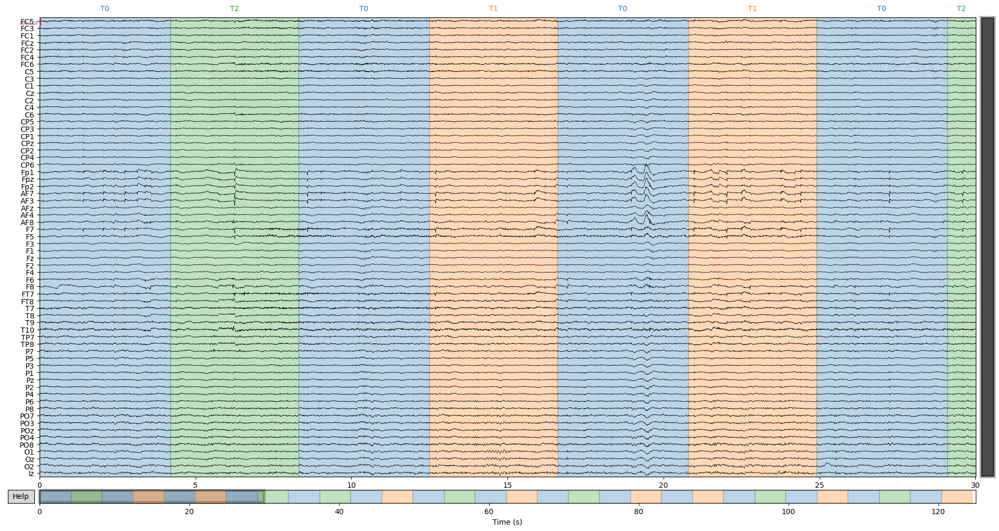

In [23]:
cutoff = 1. # Hz
raw_hp = raw_notch.copy().filter(l_freq=cutoff, h_freq=None)
raw_hp.plot(duration=30, n_channels=len(raw.ch_names), scalings={'eeg':200e-6}, remove_dc=False)

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 529 samples (3.306 sec)



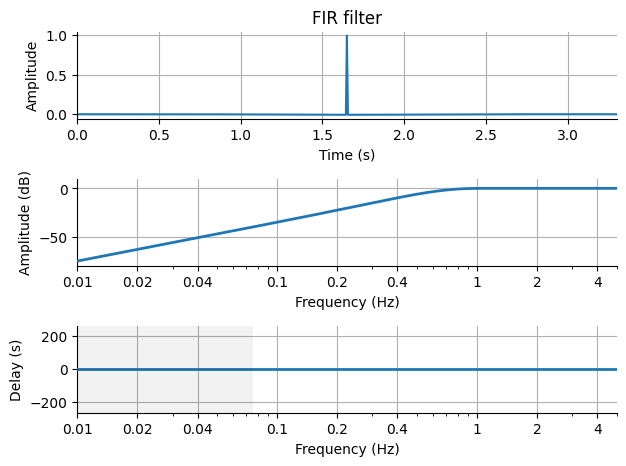

In [24]:
filter_params = mne.filter.create_filter(raw.get_data(),
                                         raw.info['sfreq'],
                                         l_freq=cutoff,
                                         h_freq=None)
mne.viz.plot_filter(filter_params, raw.info['sfreq'], flim=(0.01, 5))

### Resampling

EEG and MEG recordings are notable for their high temporal precision, and are often recorded with sampling rates around 1000 Hz or higher. This is good when precise timing of events is important to the experimental design or analysis plan, but also consumes more memory and computational resources when processing the data. In cases where high-frequency components of the signal are not of interest and precise timing is not needed (e.g., computing EOG or ECG projectors on a long recording), downsampling the signal can be a useful time-saver.

In MNE-Python, the resampling methods (raw.resample(), epochs.resample() and evoked.resample()) apply a low-pass filter to the signal to avoid aliasing

Effective window size : 34.133 (s)


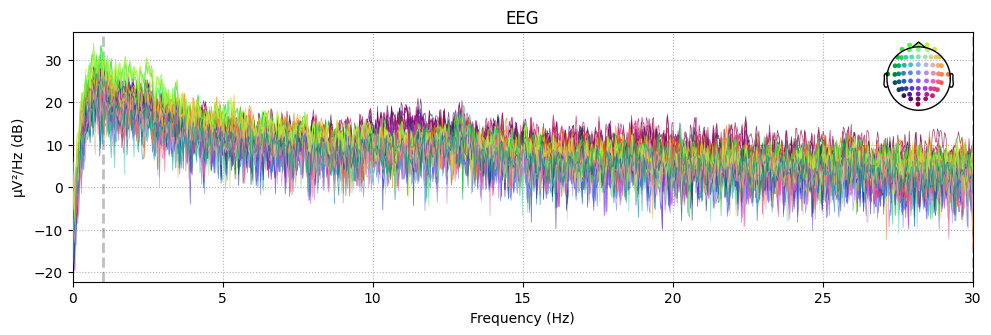

In [25]:
raw_downsampled = raw_hp.copy().resample(sfreq=60)
raw_downsampled.plot_psd()

Opening raw-browser...


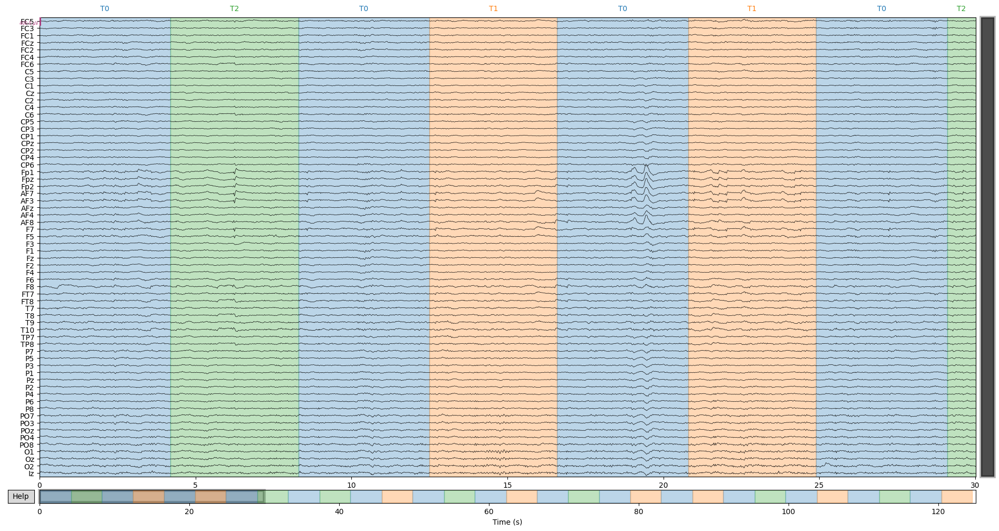

In [111]:
raw_downsampled.plot(duration=30, n_channels=len(raw.ch_names), scalings={'eeg':200e-6}, remove_dc=False)

## Step 5: ICA

Independent components analysis (ICA) is a technique for estimating independent source signals from a set of recordings in which the source signals were mixed together in unknown ratios.

In [26]:
ica = mne.preprocessing.ICA(n_components=10, max_iter='auto', random_state=97)
ica.fit(raw_hp)
ica

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.8s.


Method,fastica
Fit,30 iterations on raw data (20000 samples)
ICA components,10
Explained variance,92.5 %
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


Now we can examine the ICs to see what they captured. plot_sources will show the time series of the ICs.

Creating RawArray with float64 data, n_channels=10, n_times=20000
    Range : 0 ... 19999 =      0.000 ...   124.994 secs
Ready.
Opening ica-browser...


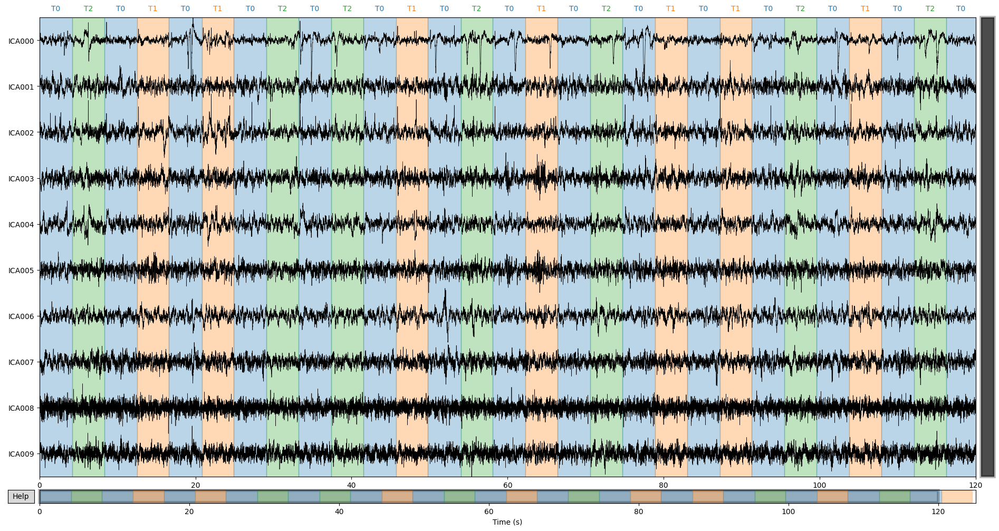

In [28]:
raw_hp.load_data()
ica.plot_sources(raw_hp, start=0, stop=120)

We can also visualize the scalp field distribution of each component using plot_components. These are interpolated based on the values in the ICA mixing matrix:

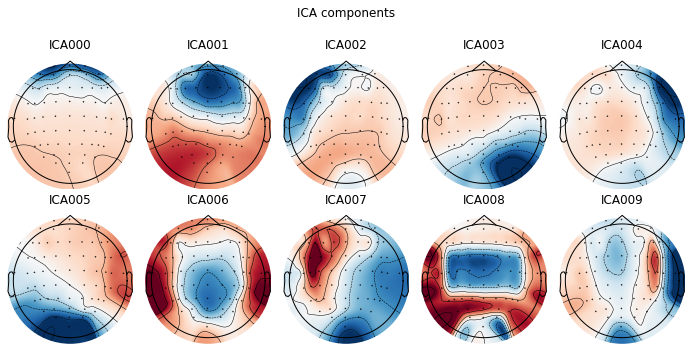

In [34]:
%matplotlib inline
fig = ica.plot_components(show=False)


In the plots above it’s fairly obvious which ICs are capturing our EOG and ECG artifacts, but there are additional ways visualize them anyway just to be sure. First, we can plot an overlay of the original signal against the reconstructed signal with the artifact ICs excluded, using plot_overlay:

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components


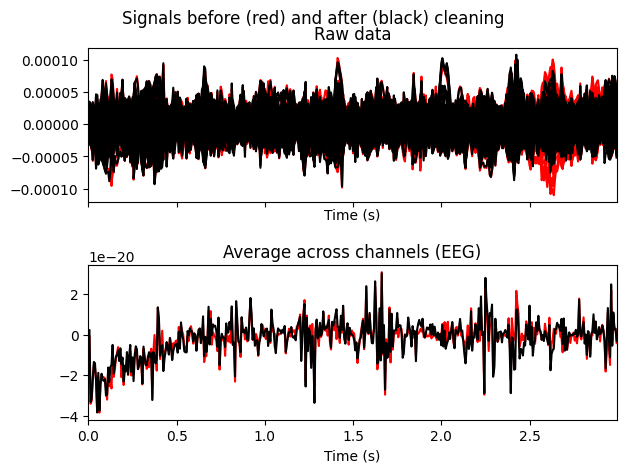

In [23]:
ica.plot_overlay(raw_hp, exclude=[0], picks='eeg')

We can also plot some diagnostics of each IC using plot_properties:

In [142]:
ica.plot_properties(raw_hp, picks=[0,])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
62 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


[<Figure size 700x600 with 6 Axes>]

### Selecting ICA components manually

Once we’re certain which components we want to exclude, we can specify that manually by setting the `ica.exclude attribute`. Similar to marking bad channels, merely setting `ica.exclude` doesn’t do anything immediately (it just adds the excluded ICs to a list that will get used later when it’s needed). Once the exclusions have been set, ICA methods like plot_overlay will exclude those component(s) even if no exclude parameter is passed, and the list of excluded components will be preserved when using `mne.preprocessing.ICA.save` and `mne.preprocessing.read_ica`.

In [35]:
ica.exclude = [0,]  # indices chosen based on various plots above

Now that the exclusions have been set, we can reconstruct the sensor signals with artifacts removed using the apply method (remember, we’re applying the ICA solution from the filtered data to the original unfiltered signal). Plotting the original raw data alongside the reconstructed data shows that the heartbeat and blink artifacts are repaired.

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 1 ICA component
    Projecting back using 64 PCA components
Opening raw-browser...


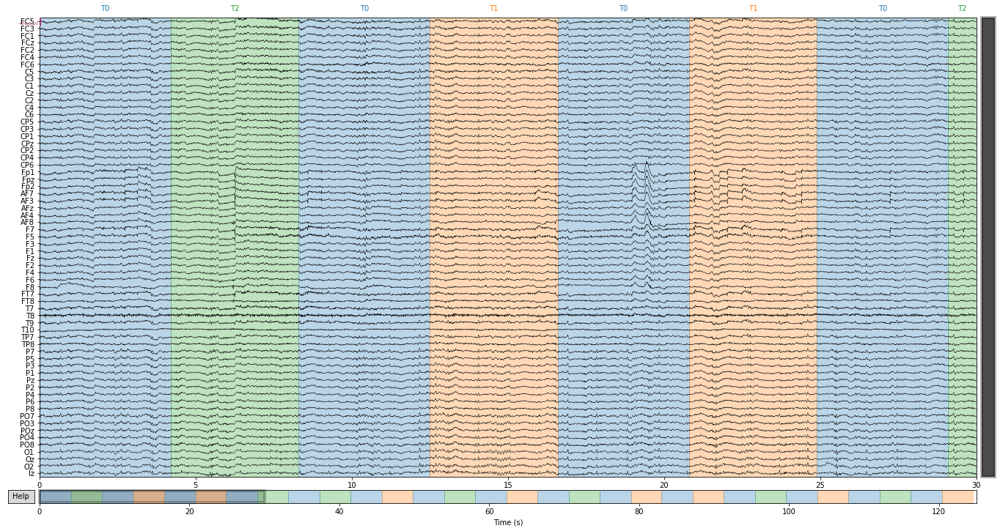

Opening raw-browser...


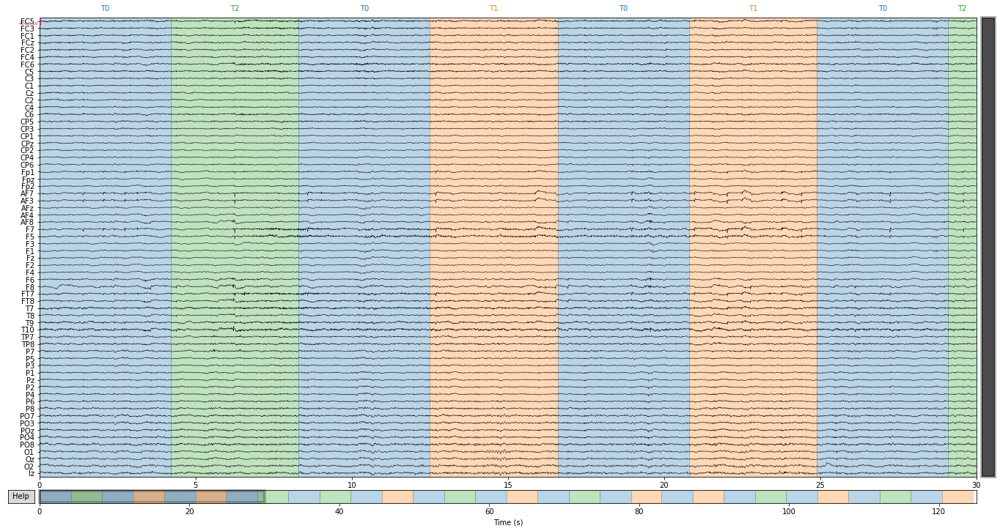

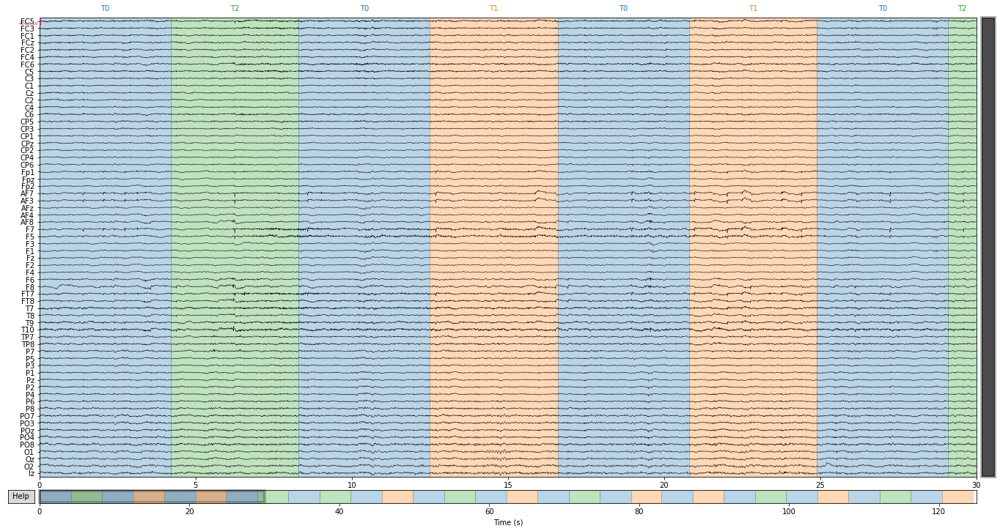

In [37]:
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_hp.copy()
ica.apply(reconst_raw)

raw.plot(duration=30, n_channels=len(raw.ch_names), scalings={'eeg':200e-6}, remove_dc=False)
reconst_raw.plot(duration=30, n_channels=len(raw.ch_names), scalings={'eeg':200e-6}, remove_dc=False)

## Step 6: Parsing Events

A raw EEG file contains continuous activity of EEG signals, recorded over a period of time. Very often, we use EEG to analyze neural responses to external events of the environment. For example, we may want to study how the brain responds to a set of images, or sounds. For this reason, instead of analyzing a continuous time-course of activity, we want to focus on *parts* of the EEG signals, which correspond to the time when external events occurred.

Typically, during an experiment we mark the time when important events occur by integrating *triggers* into an EEG recording, which can be imported as 'Events'.
An 'Event' will essentially give us information of *when* in time an external stimulus was presented, and of *what* this stimulus was.

Once we have this information, we can convert our raw EEG signal to Epochs. This consists of extracting chunks of EEG data around a given window, marked by the time when each external event occurred.

To do this conversion in python, we first need to read a file of external events. If the data is annotated, then the events can be extracted easily by event_from_annotations() function of MNE. The function will return both events and event ids.

Used Annotations descriptions: ['T0', 'T1', 'T2']
{'T0': 1, 'T1': 2, 'T2': 3}
[[    0     0     1]
 [  672     0     3]
 [ 1328     0     1]
 [ 2000     0     2]
 [ 2656     0     1]
 [ 3328     0     2]
 [ 3984     0     1]
 [ 4656     0     3]
 [ 5312     0     1]
 [ 5984     0     3]
 [ 6640     0     1]
 [ 7312     0     2]
 [ 7968     0     1]
 [ 8640     0     3]
 [ 9296     0     1]
 [ 9968     0     2]
 [10624     0     1]
 [11296     0     3]
 [11952     0     1]
 [12624     0     2]
 [13280     0     1]
 [13952     0     2]
 [14608     0     1]
 [15280     0     3]
 [15936     0     1]
 [16608     0     2]
 [17264     0     1]
 [17936     0     3]
 [18592     0     1]
 [19264     0     2]]


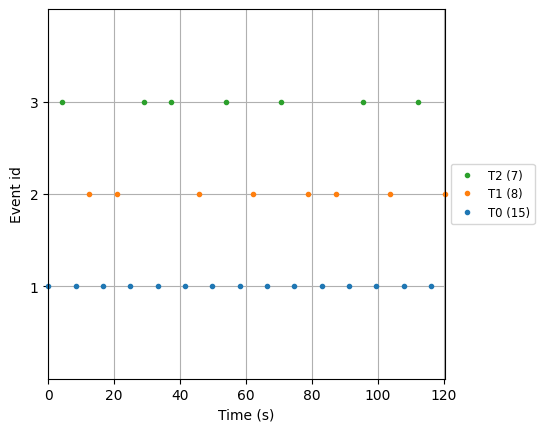

In [39]:
%matplotlib qt
events_from_annot, event_dict = mne.events_from_annotations(raw)
print(event_dict)
print(events_from_annot)

mne.viz.plot_events(events_from_annot, sfreq=raw.info['sfreq'],
                          first_samp=raw.first_samp, event_id=event_dict)
# fig.subplots_adjust(right=0.7)  # make room for legend

### How do we select the time interval that we want to analyze?

To be able to define epochs in our EEG data, a time interval of interest should be selected.

tmin and tmax represent the beginning and the end of selected time interval (in seconds). This selection may differ, depending on the experiment. If the reponse to the given stimuli is expected to happen quickly, then a narrow time interval may be needed and vice versa.

For example, if our goal is to study basic sensory processing, e.g. resposnes to simple visual or auditory stimuli, then we expect EEG responses to appear relatively early i.e. within a few hundrend miliseconds after the onset of the stimuli. If by contrast our goal is to study higher cognitive functions, e.g. mental imagery, or decision-making, we will very likely need to extract a longer interval in order to capture the relevant EEG responses.

In the following example, we define epochs lasting for 4 seconds after the event onset.

As it is typical in EEG analysis, we also define a baseline, i.e. an interval of relative 'inactivity'. Post-stimulus responses are typically contrasted with respect to this baseline.

Reference:
[1] [How do we select the time interval that we want to analyze](https://neuro.inf.unibe.ch/AlgorithmsNeuroscience/Tutorial_files/DataLoading.html)

In [27]:
# epochs = mne.Epochs(raw, events=events_from_annot)
tmin, tmax = -1, 4  # define epochs around events (in s)
#event_ids = dict(hands=2, feet=3)  # map event IDs to tasks

epochs = mne.Epochs(reconst_raw, events_from_annot, event_dict, tmin - 0.5, tmax + 0.5, preload=True, reject=None)

#Access to the data
data = epochs.get_data()

n_events = len(data) # or len(epochs.events)
print("Number of events: " + str(n_events))

n_channels = len(data[0,:]) # or len(epochs.ch_names)
print("Number of channels: " + str(n_channels))

n_times = len(data[0,0,:]) # or len(epochs.times)
print("Number of time instances: " + str(n_times))

Not setting metadata
30 matching events found
Setting baseline interval to [-1.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 961 original time points ...
1 bad epochs dropped
Number of events: 29
Number of channels: 64
Number of time instances: 961


# Save data

In [28]:
data_csv = data.reshape( [-1, data.shape[-1]] )
preprocessed_dir = './data/preprocessed'
csv_file = file_name.split('.')[0]+'.csv'
np.savetxt(os.path.join(preprocessed_dir, csv_file),
           data_csv,
           delimiter=',')

In [34]:
label_csv = epochs.events[:, 2].astype(np.int32)
label_file = file_name.split('.')[0]+'_label.csv'
label_file = os.path.join(preprocessed_dir, label_file)
np.savetxt(label_file,
           label_csv,
           delimiter=',')

In [163]:
a = np.arange(0, 12).reshape(2,2,3)
b = a.reshape([-1,3])
print(a)
print(b.reshape([-1, 2, 3]))

[[[ 0  1  2]
  [ 3  4  5]]

 [[ 6  7  8]
  [ 9 10 11]]]
[[[ 0  1  2]
  [ 3  4  5]]

 [[ 6  7  8]
  [ 9 10 11]]]
